# <h1 style="text-align: center;">Optimal Control of TCLab using a Gaussian process regression embedded in Pyomo - notebook v4</h1>

<p style="text-align: center;">Alex Dowling<sup>1</sup>, Jacob P. Krell<sup>2</sup>

<p style="text-align: center;"><sup>1</sup>Department of Chemical and Biomolecular Engineering, University of Notre Dame, Notre Dame, IN 46556, USA <br>
<sup>2</sup>Department of Mechanical and Aerospace Engineering, West Virginia University, Morgantown, WV, 26506-6106, USA</p>

## Outline

- [Introduction](#introduction)
- [Benchmark](#benchmark)
- [Derivative of Smoothed Measurements](#derivative-of-smoothed-data)
    - [Smoothing](#smoothing)
    - [Derivative](#derivative)
- [GP Model of Derivative](#gp-model-of-derivative)
- [Results](#results)

## Introduction

The scope of this notebook is concerned only with $T_{S,1}$ and $Q_1$.

In [14]:
import os
dir = os.path.abspath('')  # directory of notebook
import pandas as pd
import numpy as np
from FoKL import FoKLRoutines
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

In [15]:
# Load data:
filename = "tclab_sine_test.csv"
data = pd.read_csv(os.path.join(dir, filename))

# Parse data:
tvec = data["Time"].values
Q1 = data["Q1"].values
TS1 = data["T1"].values

# Analytic expressions of heater power:
Q1f = lambda t: 50 * np.sin(30 * np.pi * t / tvec[-1]) + 50
dQ1f = lambda t: 1500 * np.sin(30 * np.pi * t / tvec[-1]) * np.pi / tvec[-1]


## Benchmark

Predicting temperatures via the two-state ODE,

In [16]:
alpha = 0.00016      # watts / (units P1 * percent U1)
P1 = 200             # P1 units
T_amb = TS1[0]       # ambient temperature
IC = [T_amb, T_amb]  # initial condition of states [TH1, TS1]
CpH =  7.006         # J/degC
CpS = 0.01           # J/degC
Ua =  0.051          # W/degC
Ub =  0.001          # W/degC

In [17]:
def dy_benchmark(t, y):
    """Benchmark ODE, for TS1."""
    TH1, TS1 = y
    dTH1 = (Ua * (T_amb - TH1) + Ub * (TS1 - TH1) + alpha * P1 * Q1f(t)) / CpH
    dTS1 = Ub * (TH1 - TS1) / CpS
    return [dTH1, dTS1]

soln_benchmark = solve_ivp(dy_benchmark, [tvec[0], tvec[-1]], IC, t_eval=tvec)

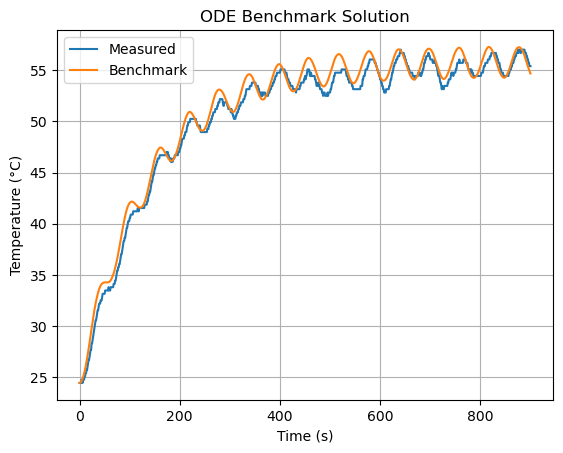

In [18]:
TS1_benchmark = soln_benchmark.y[1]

%matplotlib inline
plt.figure()
plt.plot(tvec, TS1)
plt.plot(tvec, TS1_benchmark)
plt.grid()
plt.title('ODE Benchmark Solution')
plt.xlabel('Time (s)')
plt.ylabel('Temperature (°C)')
_ = plt.legend(['Measured', 'Benchmark'])

## Derivative of Smoothed Data

Since raw measurements are noisy, a smoothing functions is applied before calculating the time derivative.

### Smoothing

Using a GP as the smoothing function,

In [19]:
GP_T = FoKLRoutines.FoKL(kernel=1, UserWarnings=False)
_ = GP_T.fit([tvec, Q1], TS1, clean=True)

[1, 3592.127247512837]
[2, 3587.245251431803]
[2, 2325.6195698812176]
[3, 2307.576809156444]
[3, 574.1060402705099]
[4, 574.1060402705099]
[4, 540.9138514384176]
[4, -331.62357408654935]
[5, -331.62357408654935]
[5, -331.62357408654935]
[5, -384.5296810595524]
[6, -384.5296810595524]
[6, -384.5296810595524]
[6, -391.2268172424733]
[6, -394.6888620369673]
[7, -394.6888620369673]
[7, -394.6888620369673]
[7, -390.73500263956225]


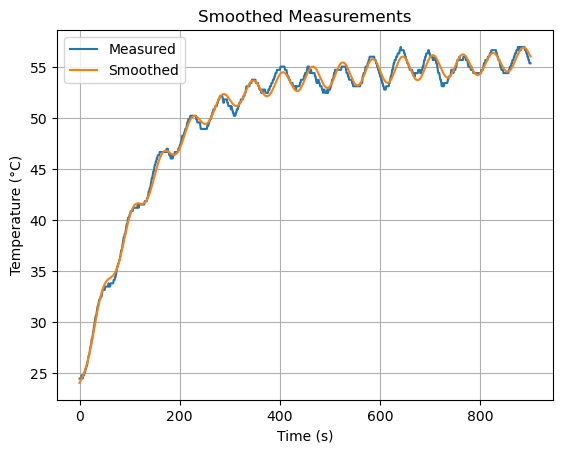

In [20]:
TS1_smooth = GP_T.evaluate()

%matplotlib inline
plt.figure()
plt.plot(tvec, TS1)
plt.plot(tvec, TS1_smooth)
plt.grid()
plt.title('Smoothed Measurements')
plt.xlabel('Time (s)')
plt.ylabel('Temperature (°C)')
_ = plt.legend(['Measured', 'Smoothed'])

### Derivative

Applying the chain rule to obtain training data,

In [84]:
dGP = GP_T.bss_derivatives()  # gradient of GP_T

dGPdt = interp1d(tvec, dGP[:, 0])
dGPdQ1 = interp1d(tvec, dGP[:, 1])
dTS1f = lambda t: dGPdt(t) + dGPdQ1(t) * dQ1f(t)  # interpolation function

dTS1 = dTS1f(tvec)  # evaluate interpolation function at tvec to form training data
# == dTS1 = dGP[:, 0] + dGP[:, 1] * dQ1f(tvec)

Validating training data:

In [85]:
def dy_training(t, y):
    """ODE to integrate GP's training data'."""
    return [dTS1f(t)]

soln_training = solve_ivp(dy_training, [tvec[0], tvec[-1]], [TS1_smooth[0]], t_eval=tvec)

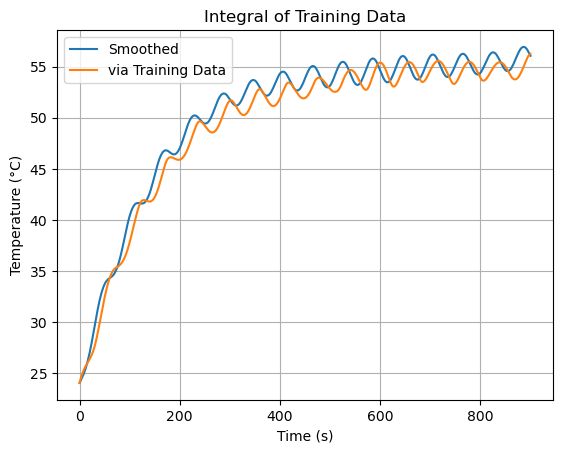

In [86]:
TS1_training = soln_training.y[0]

%matplotlib inline
plt.figure()
plt.plot(tvec, TS1_smooth)
plt.plot(tvec, TS1_training)
plt.grid()
plt.title('Integral of Training Data')
plt.xlabel('Time (s)')
plt.ylabel('Temperature (°C)')
_ = plt.legend(['Smoothed', 'via Training Data'])

## GP Model of Derivative

In [24]:
GP_dT = FoKLRoutines.FoKL(kernel=1, UserWarnings=False)
_ = GP_dT.fit([TS1, Q1], dTS1, clean=True)

[1, -7386.6445756922685]
[2, -7451.63534533504]
[2, -7477.201978362227]
[3, -7622.093964139244]
[3, -7645.230653602579]
[4, -7640.069786962274]
[4, -7770.547221967584]
[4, -7950.3187913355305]
[5, -7950.3187913355305]
[5, -7950.3187913355305]
[5, -8069.87442415835]
[6, -8069.87442415835]
[6, -8069.87442415835]
[6, -8117.875843492265]
[6, -8130.737405679462]
[7, -8132.9485147949945]
[7, -8136.641659851548]
[7, -8229.803502520639]
[7, -8223.046144169612]
[8, -8223.046144169612]
[8, -8223.046144169612]


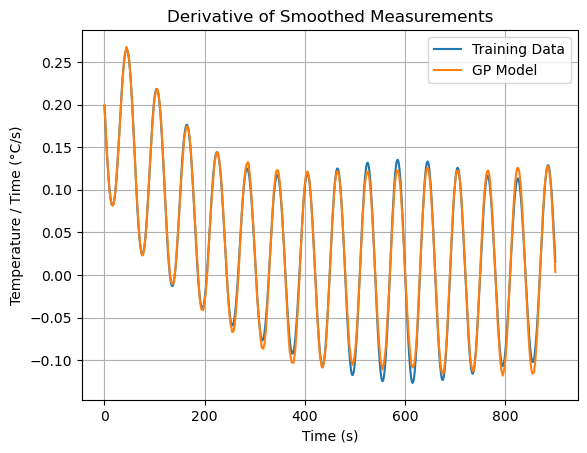

In [87]:
dTS1_GP = GP_dT.evaluate()

%matplotlib inline
plt.figure()
plt.plot(tvec, dTS1)
plt.plot(tvec, dTS1_GP)
plt.grid()
plt.title('Derivative of Smoothed Measurements')
plt.xlabel('Time (s)')
plt.ylabel('Temperature / Time (°C/s)')
_ = plt.legend(['Training Data', 'GP Model'])

In [26]:
def dy_GP(t, y):
    """ODE to integrate GP of derivative."""
    return [GP_dT.evaluate([y[0], Q1f(t)], clean=True, SingleInstance=True)[0]]

soln_GP = solve_ivp(dy_GP, [tvec[0], tvec[-1]], [TS1_smooth[0]], 'LSODA', tvec)

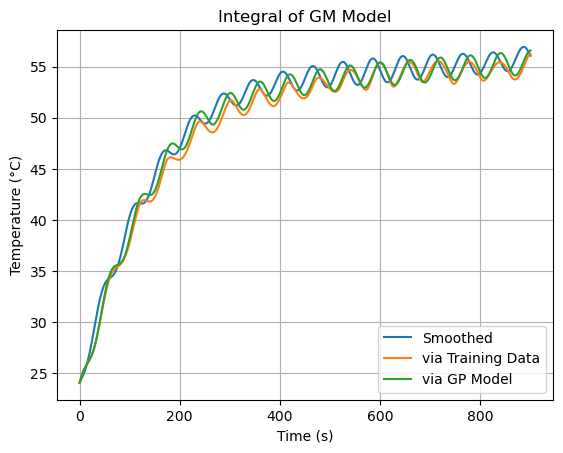

In [89]:
TS1_dGP = soln_GP.y[0]

%matplotlib inline
plt.figure()
plt.plot(tvec, TS1_smooth)
plt.plot(tvec, TS1_training)
plt.plot(tvec, TS1_dGP)
plt.grid()
plt.title('Integral of GM Model')
plt.xlabel('Time (s)')
plt.ylabel('Temperature (°C)')
_ = plt.legend(['Smoothed', 'via Training Data', 'via GP Model'])

Attempting to prevent phase shift by beginning integration after burn-in period:

In [28]:
t_start = [20, 40, 60]

t_burnin = []
soln_GP_burnin = []
for i in range(len(t_start)):
    t_burnin.append(np.linspace(t_start[i], tvec[-1], int(tvec[-1] - t_start[i])))
    soln_GP_burnin.append(solve_ivp(dy_GP, [t_burnin[i][0], t_burnin[i][-1]], [TS1_smooth[t_start[i]]], 'LSODA', t_burnin[i]))

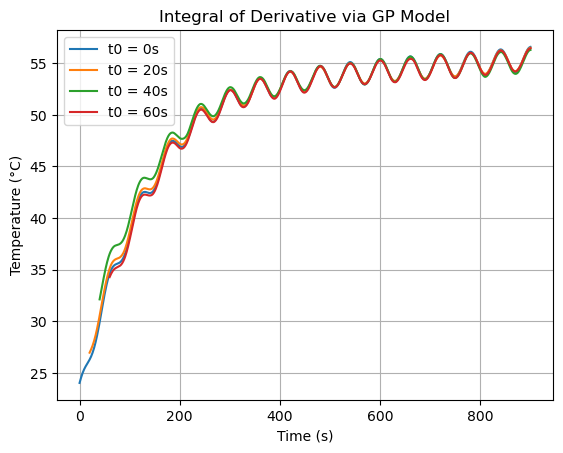

In [29]:
TS1_dGP_burnin = list(soln_GP_burnin[i].y[0] for i in range(len(t_start)))

%matplotlib inline
plt.figure()
plt.plot(tvec, TS1_dGP, label="t0 = 0s")
for i in range(len(t_start)):
    plt.plot(t_burnin[i], TS1_dGP_burnin[i], label=f"t0 = {t_start[i]}s")
plt.grid()
plt.title('Integral of Derivative via GP Model')
plt.xlabel('Time (s)')
plt.ylabel('Temperature (°C)')
_ = plt.legend()

## Results

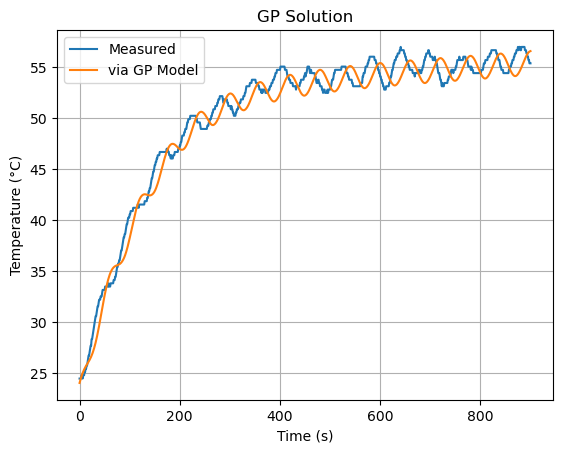

In [30]:
%matplotlib inline
plt.figure()
plt.plot(tvec, TS1)
plt.plot(tvec, TS1_dGP)
plt.grid()
plt.title('GP Solution')
plt.xlabel('Time (s)')
plt.ylabel('Temperature (°C)')
_ = plt.legend(['Measured', 'via GP Model'])

## Conclusion

It is unknown why the phase shift occurs.
- The integral of $\mathbf{GP}_{\Delta T}$ aligns fairly well with the integral of the training data. However, the training data itself, i.e., the derivative of the smoothed measurements, qualitatively appears to have introduced the most error as a significant phase shift occurs in this step.
- It was hopeful that the majority of phase shift was introduced by the $Q_1$ analytic expression being slightly off. This could have made sense since the chain rule incorporates $\dot{Q}_1(t)$; however, since *pyomo_tclab_v4.1.ipynb* showed the equivalence of the chain rule with the numerical derivative using finite-differences, which does not depend on $\dot{Q}_1(t)$, the phase shift cannot be from the $Q_1$ analytic expression. Instead, finite differences implies that the start time $t_{\text{start}}$ of the GP ODE solver may be the source.
- In the above figure, since $t_{\text{start}}$ of the ODE for the GP appears negligible, the integration itself is unlikely to be the source of the phase shift.

---

# Additional Analyses

In [31]:
from scipy.interpolate import CloughTocher2DInterpolator

3D plot of smoothing GP:

In [32]:
TS1_grid, Q1_grid = np.meshgrid(np.linspace(TS1.min(), TS1.max(), 20), 
                                np.linspace(Q1.min(), Q1.max(), 20))
dTS1_GP_grid = GP_dT.evaluate([TS1_grid.flatten(), Q1_grid.flatten()], clean=True)
dTS1_GP_grid = dTS1_GP_grid.reshape(TS1_grid.shape)

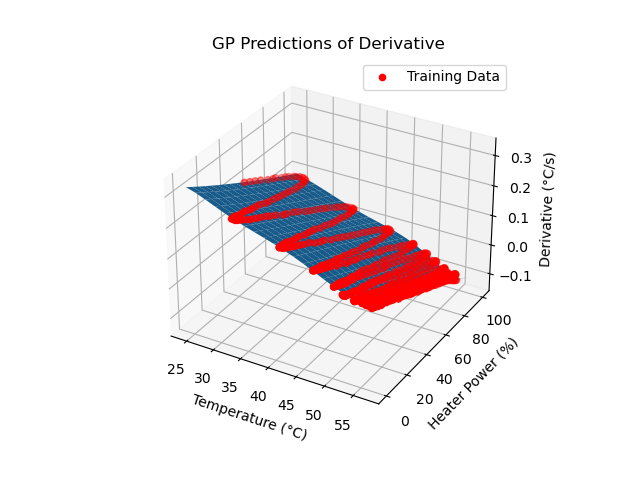

In [34]:
%matplotlib widget
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
ax.scatter(TS1, Q1, dTS1, color='r', label='Training Data')
ax.plot_surface(TS1_grid, Q1_grid, dTS1_GP_grid)
ax.set_title('GP Predictions of Derivative')
ax.set_xlabel('Temperature (°C)')
ax.set_ylabel('Heater Power (%)')
ax.set_zlabel('Derivative (°C/s)')
ax.legend()
ax.grid()

# Test of integration of gradient for non-GP data

In [35]:
def _test_curve(x, y, title):
    dy = np.gradient(y, x)
    interp_dy = interp1d(x, dy)

    def ode(t, state):
        return interp_dy(t)

    sol = solve_ivp(ode, [x[0], x[-1]], [y[0]], t_eval=x)
    y_via_dy = sol.y[0]

    %matplotlib inline
    plt.figure()
    plt.title(title)
    plt.plot(x, y)
    plt.plot(x, y_via_dy)
    plt.grid()
    plt.legend(['y', 'via dy'])

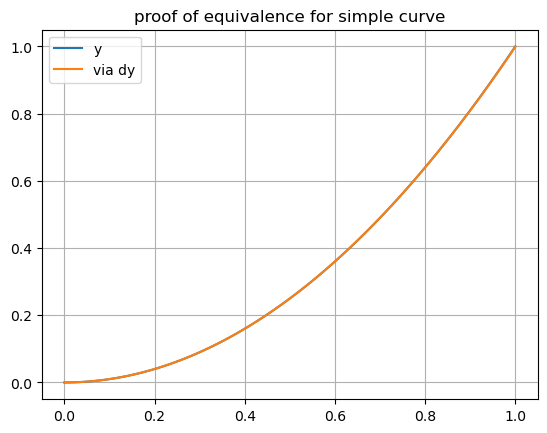

In [36]:
_test_curve(np.linspace(0, 1, 100), 
            np.linspace(0, 1, 100) ** 2, 
            'proof of equivalence for simple curve')

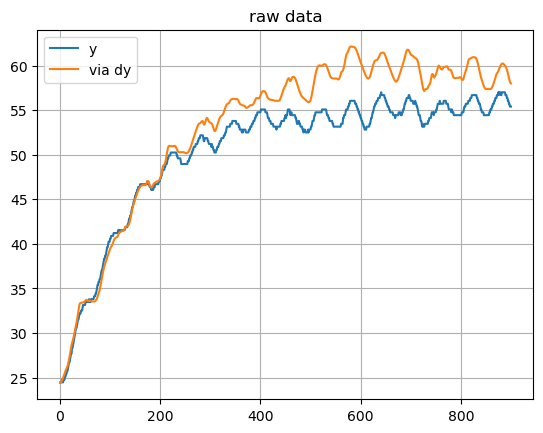

In [37]:
_test_curve(tvec, TS1, 'raw data')

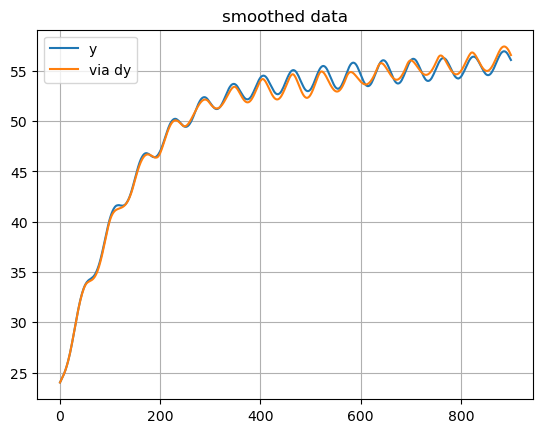

In [38]:
_test_curve(tvec, TS1_smooth, 'smoothed data')

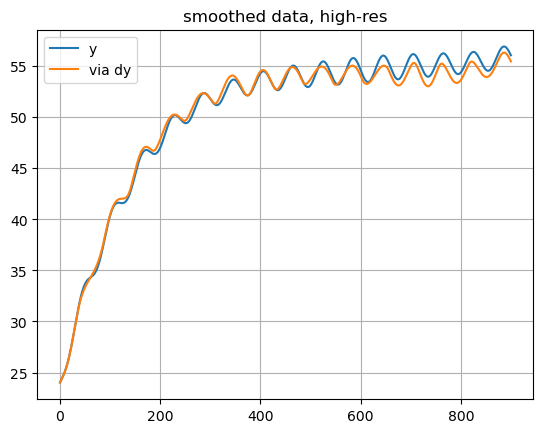

In [39]:
tvec_dense = np.linspace(tvec[0], tvec[-1], int(1e5))
_test_curve(tvec_dense, GP_T.evaluate([tvec_dense, Q1f(tvec_dense)], clean=True), 'smoothed data, high-res')

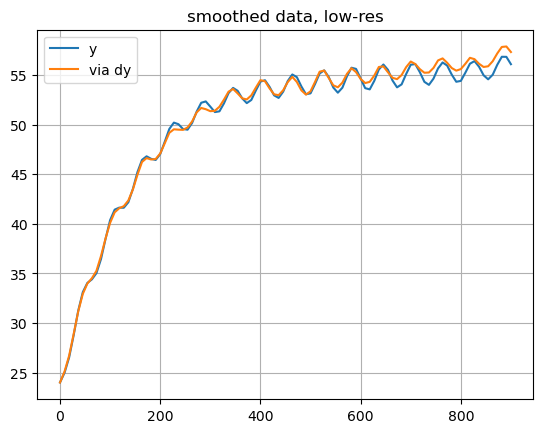

In [40]:
tvec_slim = np.linspace(tvec[0], tvec[-1], int(1e2))
_test_curve(tvec_slim, GP_T.evaluate([tvec_slim, Q1f(tvec_slim)], clean=True), 'smoothed data, low-res')

## Integrating GP at fixed time step

Since the high-resolution test fails, it is expected for the ODE solver to also fail since it too evaluates at small time steps. With both the high-res. and low-res. tests failing, it may not be a fixed time step that enables an accurate integral of a GP but rather an appropriate time vector based on the size of the training data.

Returning to the original plan but now with the GP integrated at the fixed time vector,

In [41]:
def _plot(TS1_training_test, title, x=tvec):
    %matplotlib inline
    plt.figure()
    plt.plot(tvec, TS1_smooth)
    plt.plot(x, TS1_training_test)
    plt.grid()
    plt.title(title)
    plt.xlabel('Time (s)')
    plt.ylabel('Temperature (°C)')
    plt.legend(['Smoothed', 'via Training Data'])

def dy_training(t, y):
    """ODE to integrate GP's training data'."""
    return [dTS1f(t)]

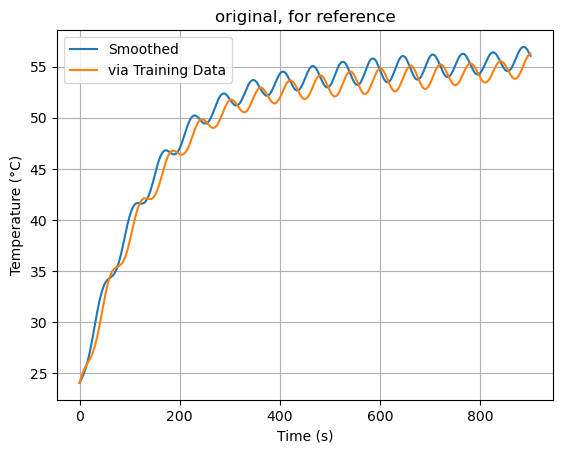

In [42]:
soln_training_test = solve_ivp(dy_training, [tvec[0], tvec[-1]], [TS1_smooth[0]], 'LSODA', tvec)
_plot(soln_training_test.y[0], 'original, for reference')

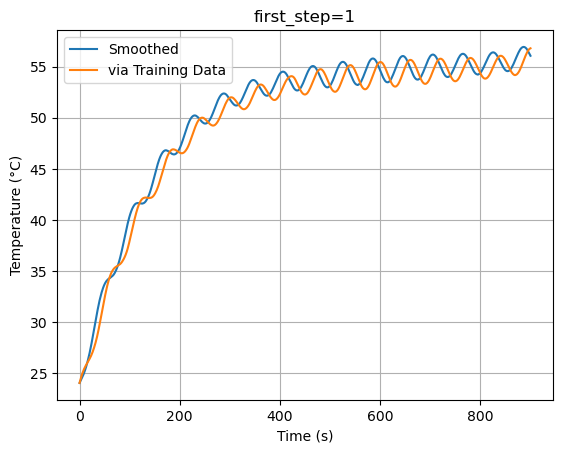

In [43]:
soln_training_test = solve_ivp(dy_training, [tvec[0], tvec[-1]], [TS1_smooth[0]], 'LSODA', tvec, first_step=1)
_plot(soln_training_test.y[0], 'first_step=1')

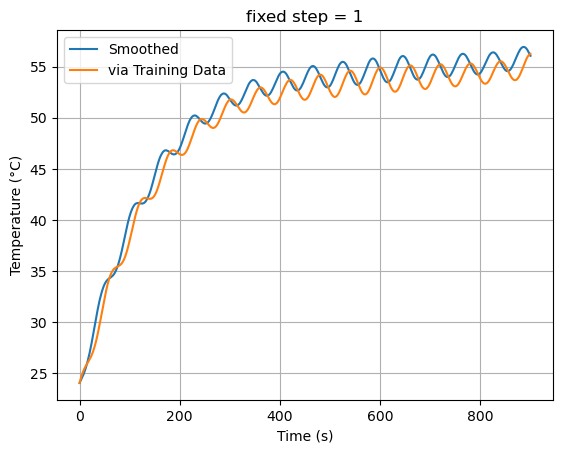

In [44]:
soln_training_test = solve_ivp(dy_training, [tvec[0], tvec[-1]], [TS1_smooth[0]], 'LSODA', tvec, first_step=1, min_step=1, max_step=1)
_plot(soln_training_test.y[0], 'fixed step = 1')

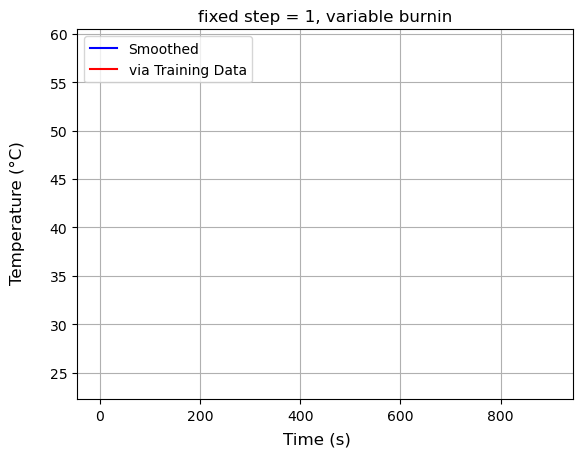

In [45]:
import matplotlib.animation as animation
from IPython.display import display, HTML


%matplotlib inline
fig, ax = plt.subplots()
fig.supxlabel('Time (s)')
fig.supylabel('Temperature (°C)')
ax.grid()
artists = []
for burnin in range(1, 200, 2):

    soln_training_test = solve_ivp(dy_training, [tvec[burnin], tvec[-1]], [TS1_smooth[burnin]], 'LSODA', tvec[burnin::], first_step=1, min_step=1, max_step=1)
    
    plt1, = ax.plot(tvec, TS1_smooth, color='b', animated=True)
    plt2, = ax.plot(tvec[burnin::], soln_training_test.y[0], color='r', animated=True)
    artists.append([plt1, plt2])

ax.set_title("fixed step = 1, variable burnin")
ax.legend(['Smoothed', 'via Training Data'])
ani = animation.ArtistAnimation(fig, artists, blit=False)
display(HTML(ani.to_jshtml()))

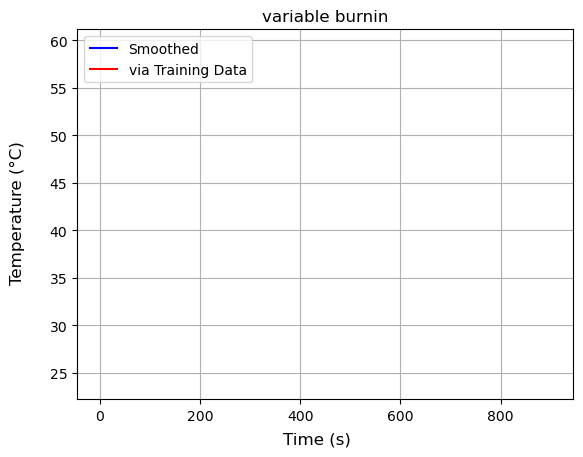

In [46]:
%matplotlib inline
fig, ax = plt.subplots()
fig.supxlabel('Time (s)')
fig.supylabel('Temperature (°C)')
ax.grid()
artists = []
for burnin in range(1, 200, 2):

    soln_training_test = solve_ivp(dy_training, [tvec[burnin], tvec[-1]], [TS1_smooth[burnin]], 'LSODA', tvec[burnin::])
    
    plt1, = ax.plot(tvec, TS1_smooth, color='b', animated=True)
    plt2, = ax.plot(tvec[burnin::], soln_training_test.y[0], color='r', animated=True)
    artists.append([plt1, plt2])

ax.set_title("variable burnin")
ax.legend(['Smoothed', 'via Training Data'])
ani = animation.ArtistAnimation(fig, artists, blit=False)
display(HTML(ani.to_jshtml()))

## Attempting to model static residual because of periodic nature of burnin results

$$\text{res} = \left(T_{S,1}\right)_{\text{smooth}} - \left(T_{S,1}\right)_{\mathbf{GP}}$$

$$\mathbf{GP}_{\text{res}} = \{\text{res}\ |\ t\}$$

$$\left(T_{S,1}\right)_{\mathbf{GP}, \text{corrected}} = \left(T_{S,1}\right)_{\mathbf{GP}} + \text{res}_{\mathbf{GP}}$$

In [56]:
res = TS1_smooth - TS1_dGP

In [58]:
print("Training without Q1:")
GP_res_noQ1 = FoKLRoutines.FoKL(kernel=1, UserWarnings=False)
GP_res_noQ1.fit(tvec, res, clean=True)

print("\nTraining with Q1:")
GP_res_yesQ1 = FoKLRoutines.FoKL(kernel=1, UserWarnings=False)
_ = GP_res_yesQ1.fit([tvec, Q1], res, clean=True)

Training without Q1:
[1, 1056.235005388474]
[2, 1060.4249870352924]
[3, 1060.4249870352924]
[4, 1060.4249870352924]

Training with Q1:
[1, 539.0565822212436]
[2, 541.5823274810765]
[2, 544.6055015979063]
[3, 544.6055015979063]


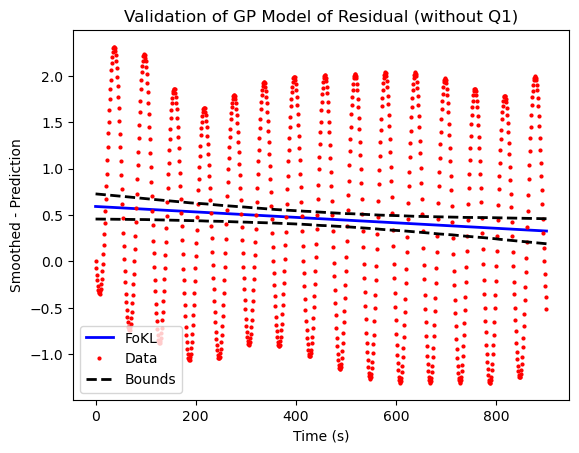

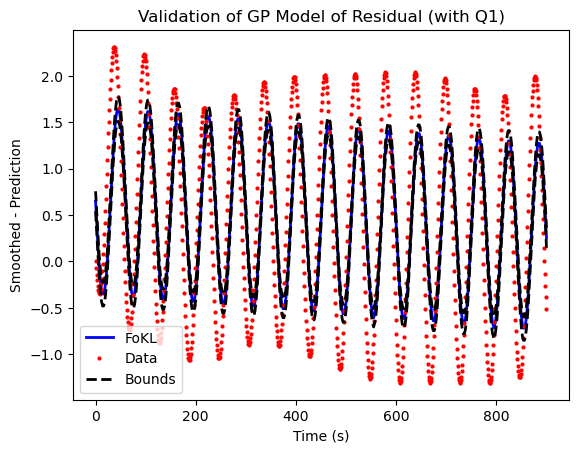

In [59]:
GP_res_noQ1.coverage3(plot=True, title='Validation of GP Model of Residual (without Q1)', ylabel='Smoothed - Prediction', xaxis=0, xlabel='Time (s)')
_ = GP_res_yesQ1.coverage3(plot=True, title='Validation of GP Model of Residual (with Q1)', ylabel='Smoothed - Prediction', xaxis=0, xlabel='Time (s)')

Since the phase shift appears to be due to a slight misalignment in the $Q_1$ analytic expression and its corresponding data, $\mathbf{GP}_{\text{res}}$ with $Q_1$ will be used to correct for this.

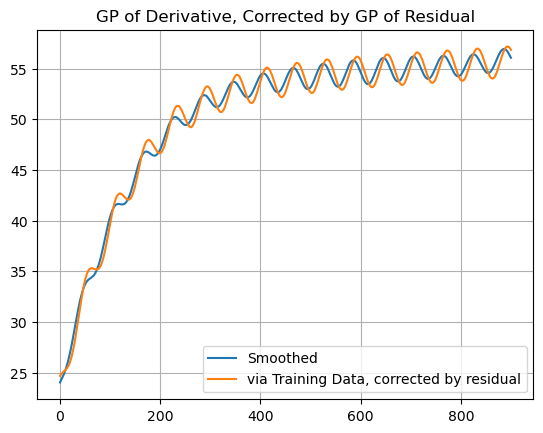

In [62]:
res_GP = GP_res_yesQ1.evaluate()
TS1_dGP_corrected = TS1_dGP + res_GP

%matplotlib inline
plt.figure()
plt.title('GP of Derivative, Corrected by GP of Residual')
plt.plot(tvec, TS1_smooth)
plt.plot(tvec, TS1_dGP_corrected)
plt.grid()
_ = plt.legend(['Smoothed', 'via Training Data, corrected by residual'])

Comparing to benchmark:

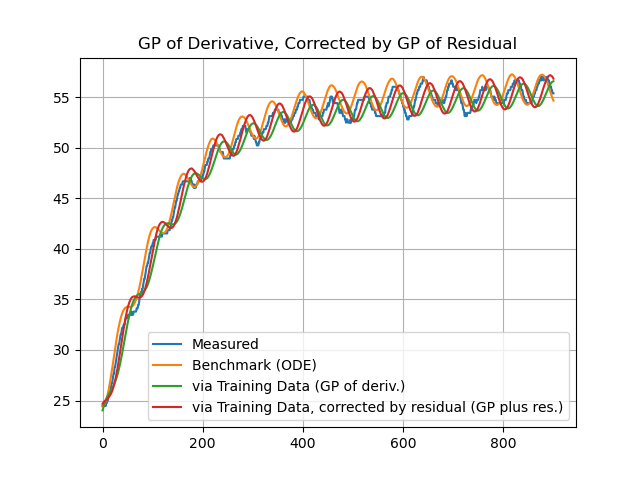

In [67]:
%matplotlib widget
plt.figure()
plt.title('GP of Derivative, Corrected by GP of Residual')
plt.plot(tvec, TS1)
plt.plot(tvec, TS1_benchmark)
plt.plot(tvec, TS1_dGP)
plt.plot(tvec, TS1_dGP_corrected)
plt.grid()
_ = plt.legend(['Measured', 'Benchmark (ODE)', 'via Training Data (GP of deriv.)', 'via Training Data, corrected by residual (GP plus res.)'])

In [68]:
_dec = 2  # decimals to round to

print("Error = Predictions - Data\n")

print(f"\nModel        | Mean Error\n\
-------------|-------------\n\
ODE          | {np.round(np.mean(TS1_benchmark - TS1), _dec)}\n\
GP of deriv. | {np.round(np.mean(TS1_dGP - TS1), _dec)}\n\
GP plus res. | {np.round(np.mean(TS1_dGP_corrected - TS1), _dec)}\n")

print(f"\nModel        | Mean Abs. Error\n\
-------------|-------------\n\
ODE          | {np.round(np.mean(np.abs(TS1_benchmark - TS1)), _dec)}\n\
GP of deriv. | {np.round(np.mean(np.abs(TS1_dGP - TS1)), _dec)}\n\
GP plus res. | {np.round(np.mean(np.abs(TS1_dGP_corrected - TS1)), _dec)}\n")

Error = Predictions - Data


Model        | Mean Error
-------------|-------------
ODE          | 0.66
GP of deriv. | -0.46
GP plus res. | -0.0


Model        | Mean Abs. Error
-------------|-------------
ODE          | 0.79
GP of deriv. | 1.23
GP plus res. | 1.0

